In [1]:
import tensorflow as tf
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import Dense,Flatten,Conv2D,MaxPooling2D
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers  import Concatenate
from tensorflow.keras.layers import AveragePooling2D, Dropout, Input, BatchNormalization
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.optimizers import SGD
from keras.preprocessing import image
from sklearn.metrics import precision_recall_curve
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import f1_score
import urllib.request
from sklearn.preprocessing import label_binarize
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score
from keras.layers import Input, Add, Dense,GlobalAvgPool2D, Concatenate, AvgPool2D, Dropout, ReLU, Activation, MaxPool2D, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, GlobalAveragePooling2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D
import matplotlib.pyplot as plt
import os
import pandas as pd
import seaborn as sns
import numpy as np
import cv2
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import RMSprop, Adam

In [2]:
image_path = "Dataset/train"

In [3]:
train_path = "Dataset/train"
valid_path = "Dataset/valid"
test_path = "Dataset/test"

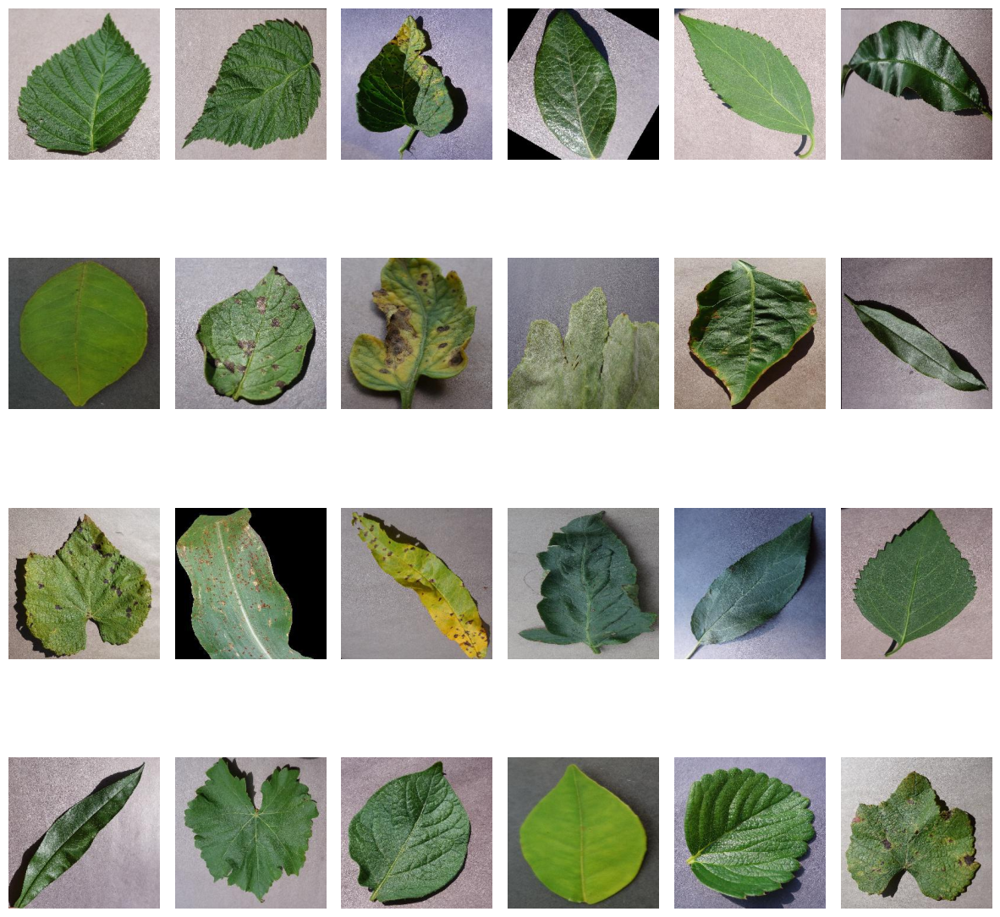

In [4]:
plt.figure(figsize=(15,15))
plt.subplots_adjust(wspace=0.1, hspace=0.1)

for i in range(24):
    random_folder=np.random.randint(0,len(os.listdir(image_path)))
    random_folder_path=os.path.join(image_path,os.listdir(image_path)[random_folder])
    random_image=np.random.randint(0,len(os.listdir(random_folder_path)))
    random_image_path=os.path.join(random_folder_path,os.listdir(random_folder_path)[random_image])
    image=cv2.imread(random_image_path)
    image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    plt.subplot(4,6,i+1)
    plt.imshow(image)
    plt.axis("off")
plt.show()

In [5]:
class_names = os.listdir(image_path)
print(class_names)

['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___healthy', 'Potato___Late_blight', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___healthy', 'Strawberry___Leaf_scorch', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___healthy', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite',

In [6]:
print("Number of classes : {}".format(len(class_names)))


Number of classes : 38


In [7]:
number_of_images = {}
for class_name in class_names:
    number_of_images[class_name] = len(os.listdir(image_path+"/"+class_name))
    
images_each_class = pd.DataFrame(list(number_of_images.items()), columns=['Class Name', 'Number of Images'])

In [8]:
images_each_class

,Class Name,Number of Images
0,Apple___Apple_scab,2016
1,Apple___Black_rot,1987
2,Apple___Cedar_apple_rust,1760
3,Apple___healthy,2008
4,Blueberry___healthy,1816
5,Cherry_(including_sour)___healthy,1826
6,Cherry_(including_sour)___Powdery_mildew,1683
7,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,1642
8,Corn_(maize)___Common_rust_,1907
9,Corn_(maize)___healthy,1859


C:\Users\PARTHO\AppData\Local\Temp\ipykernel_1984\4269897003.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y='Class Name', x='Number of Images', data=images_each_class,palette="tab20")


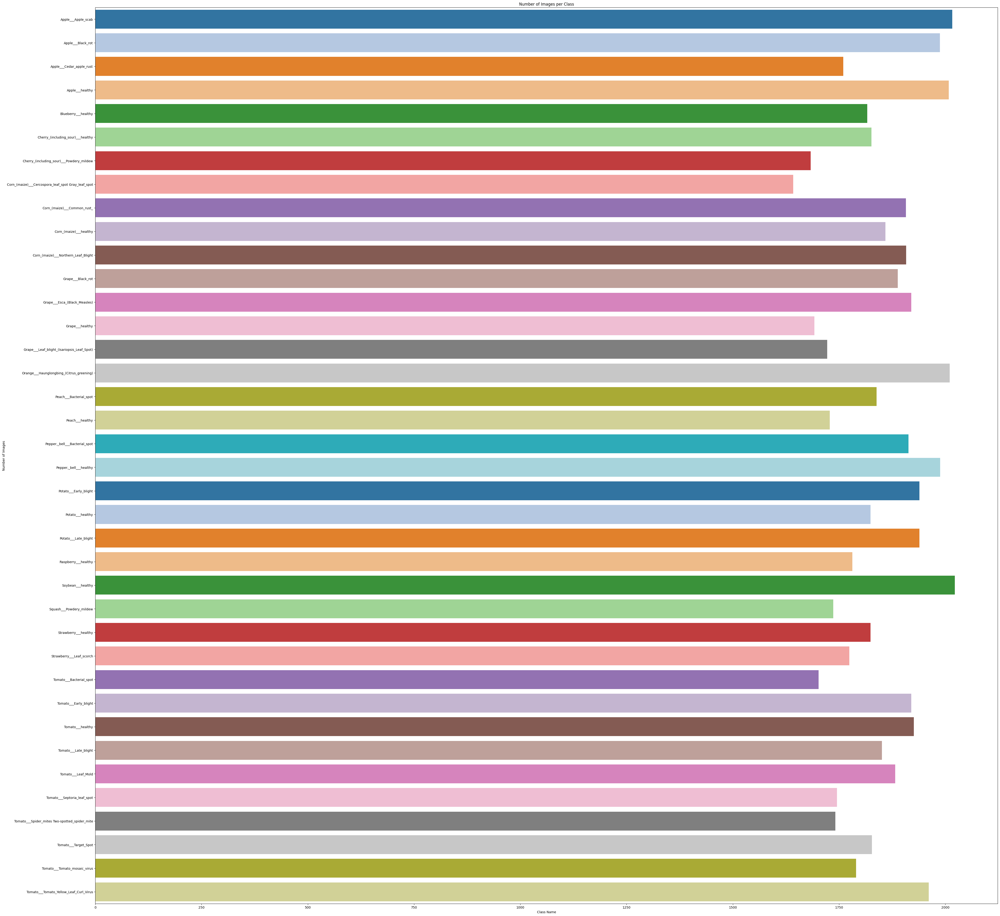

In [9]:
plt.figure(figsize=(50,50))
sns.barplot(y='Class Name', x='Number of Images', data=images_each_class,palette="tab20")
plt.title('Number of Images per Class')
plt.xlabel('Class Name')
plt.ylabel('Number of Images')
plt.show()

In [10]:
batch_size=20

In [11]:
#Data Generator
traindata_generator=tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255,zoom_range=0.2,width_shift_range=0.2,height_shift_range=0.2,
                                                                    shear_range=0.2, horizontal_flip=True,validation_split=0.2,fill_mode='nearest')

validdata_generator=tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
testdata_generator=tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

In [12]:
train_data_generator=traindata_generator.flow_from_directory(train_path,batch_size=batch_size,class_mode="categorical",
                                                           target_size=(224,224),color_mode="rgb",shuffle=True )

Found 70295 images belonging to 38 classes.


In [13]:
valid_data_generator=validdata_generator.flow_from_directory(train_path,batch_size=batch_size,class_mode="categorical",
                                                           target_size=(224,224),color_mode="rgb",shuffle=True)


Found 70295 images belonging to 38 classes.


In [14]:
test_data_generator=testdata_generator.flow_from_directory(valid_path,batch_size=batch_size,class_mode="categorical",
                                                           target_size=(224,224),color_mode="rgb",shuffle=False )

Found 17572 images belonging to 38 classes.


In [15]:
class_dict = train_data_generator.class_indices
class_list = list(class_dict.keys())
class_list

['Apple___Apple_scab',
 'Apple___Black_rot',
 'Apple___Cedar_apple_rust',
 'Apple___healthy',
 'Blueberry___healthy',
 'Cherry_(including_sour)___Powdery_mildew',
 'Cherry_(including_sour)___healthy',
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
 'Corn_(maize)___Common_rust_',
 'Corn_(maize)___Northern_Leaf_Blight',
 'Corn_(maize)___healthy',
 'Grape___Black_rot',
 'Grape___Esca_(Black_Measles)',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Grape___healthy',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Peach___Bacterial_spot',
 'Peach___healthy',
 'Pepper,_bell___Bacterial_spot',
 'Pepper,_bell___healthy',
 'Potato___Early_blight',
 'Potato___Late_blight',
 'Potato___healthy',
 'Raspberry___healthy',
 'Soybean___healthy',
 'Squash___Powdery_mildew',
 'Strawberry___Leaf_scorch',
 'Strawberry___healthy',
 'Tomato___Bacterial_spot',
 'Tomato___Early_blight',
 'Tomato___Late_blight',
 'Tomato___Leaf_Mold',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Spider_mites Two-spotted_

In [16]:
train_number=train_data_generator.samples
valid_number=valid_data_generator.samples


In [17]:
mobilenetV2_model= tf.keras.applications.MobileNetV2(weights='imagenet',classes=38,include_top=False, input_shape=(224,224, 3))
x= mobilenetV2_model.output
x= GlobalAveragePooling2D()(x)
x= Dense(1024,activation='relu')(x) 
x= Dense(512,activation='relu')(x) 
x= BatchNormalization()(x)
x= Dropout(0.2)(x)
prediction= Dense(38, activation = 'softmax')(x)
model= Model(inputs= mobilenetV2_model.input, outputs= prediction)

model.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['accuracy'])
model.summary() 

model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1 (Conv2D)                │ (None, 112, 112, 32)      │             864 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ bn_Conv1 (BatchNormalization) │ (None, 112, 112, 32)      │             128 │ Conv1[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1_relu (ReLU)             │ (None, 112, 112, 32)      │               0 │ bn_Conv1[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise       │ (None, 112, 112, 32)      │             288 │ Conv1_relu[0][0]           │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_BN    │ (None, 112, 112, 32)      │             128 │ expanded_conv_depthwise[0… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_relu  │ (None, 112, 112, 32)      │               0 │ expanded_conv_depthwise_B… │
│ (ReLU)                        │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project         │ (None, 112, 112, 16)      │             512 │ expanded_conv_depthwise_r… │
│ (Conv2D)                      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project_BN      │ (None, 112, 112, 16)      │              64 │ expanded_conv_project[0][… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand (Conv2D)       │ (None, 112, 112, 96)      │           1,536 │ expanded_conv_project_BN[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_BN             │ (None, 112, 112, 96)      │             384 │ block_1_expand[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_relu (ReLU)    │ (None, 112, 112, 96)      │               0 │ block_1_expand_BN[0][0]    │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_pad (ZeroPadding2D)   │ (None, 113, 113, 96)      │               0 │ block_1_expand_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_depthwise             │ (None, 56, 56, 96)        │             864 │ block_1_pad[0][0]          │
│ (DepthwiseConv2D)             │                           │               

 Total params: 4,116,070 (15.70 MB)

 Trainable params: 4,080,934 (15.57 MB)

 Non-trainable params: 35,136 (137.25 KB)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1 (Conv2D)                │ (None, 112, 112, 32)      │             864 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ bn_Conv1 (BatchNormalization) │ (None, 112, 112, 32)      │             128 │ Conv1[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1_relu (ReLU)             │ (None, 112, 112, 32)      │               0 │ bn_Conv1[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise       │ (None, 112, 112, 32)      │             288 │ Conv1_relu[0][0]           │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_BN    │ (None, 112, 112, 32)      │             128 │ expanded_conv_depthwise[0… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_relu  │ (None, 112, 112, 32)      │               0 │ expanded_conv_depthwise_B… │
│ (ReLU)                        │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project         │ (None, 112, 112, 16)      │             512 │ expanded_conv_depthwise_r… │
│ (Conv2D)                      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project_BN      │ (None, 112, 112, 16)      │              64 │ expanded_conv_project[0][… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand (Conv2D)       │ (None, 112, 112, 96)      │           1,536 │ expanded_conv_project_BN[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_BN             │ (None, 112, 112, 96)      │             384 │ block_1_expand[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_relu (ReLU)    │ (None, 112, 112, 96)      │               0 │ block_1_expand_BN[0][0]    │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_pad (ZeroPadding2D)   │ (None, 113, 113, 96)      │               0 │ block_1_expand_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_depthwise             │ (None, 56, 56, 96)        │             864 │ block_1_pad[0][0]          │
│ (DepthwiseConv2D)             │                           │               

 Total params: 4,116,070 (15.70 MB)

 Trainable params: 4,080,934 (15.57 MB)

 Non-trainable params: 35,136 (137.25 KB)

In [18]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='max', verbose=1, patience=50,baseline=0.4,min_delta=0.0001,restore_best_weights=False)

In [19]:
history= model.fit(train_data_generator, 
                   steps_per_epoch=train_number//batch_size, 
                   validation_data= valid_data_generator, 
                   validation_steps= valid_number//batch_size,
                   shuffle=True, 
                   
                   epochs =12, 
                   batch_size = 20,callbacks=[callback])

Epoch 1/12


C:\Users\PARTHO\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3514/3514 ━━━━━━━━━━━━━━━━━━━━ 6531s 2s/step - accuracy: 0.7934 - loss: 0.6969 - val_accuracy: 0.4777 - val_loss: 4.1183
Epoch 2/12
   1/3514 ━━━━━━━━━━━━━━━━━━━━ 3:35:19 4s/step - accuracy: 0.9500 - loss: 0.2099

C:\Program Files\WindowsApps\PythonSoftwareFoundation.Python.3.12_3.12.1776.0_x64__qbz5n2kfra8p0\Lib\contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(value)


3514/3514 ━━━━━━━━━━━━━━━━━━━━ 5s 287us/step - accuracy: 0.9500 - loss: 0.2099 - val_accuracy: 0.5333 - val_loss: 3.0823
Epoch 3/12
3514/3514 ━━━━━━━━━━━━━━━━━━━━ 6481s 2s/step - accuracy: 0.9250 - loss: 0.2393 - val_accuracy: 0.6997 - val_loss: 1.7407
Epoch 4/12
3514/3514 ━━━━━━━━━━━━━━━━━━━━ 2s 122us/step - accuracy: 0.9000 - loss: 0.2620 - val_accuracy: 0.8667 - val_loss: 1.0429
Epoch 5/12
3514/3514 ━━━━━━━━━━━━━━━━━━━━ 6793s 2s/step - accuracy: 0.9433 - loss: 0.1831 - val_accuracy: 0.6249 - val_loss: 2.2708
Epoch 6/12
3514/3514 ━━━━━━━━━━━━━━━━━━━━ 4s 228us/step - accuracy: 1.0000 - loss: 0.0662 - val_accuracy: 0.6000 - val_loss: 3.2670
Epoch 7/12
3514/3514 ━━━━━━━━━━━━━━━━━━━━ 6479s 2s/step - accuracy: 0.9562 - loss: 0.1389 - val_accuracy: 0.8999 - val_loss: 0.4430
Epoch 8/12
3514/3514 ━━━━━━━━━━━━━━━━━━━━ 3s 160us/step - accuracy: 0.9500 - loss: 0.5262 - val_accuracy: 1.0000 - val_loss: 0.0252
Epoch 9/12
3514/3514 ━━━━━━━━━━━━━━━━━━━━ 6576s 2s/step - accuracy: 0.9628 - loss: 0.11

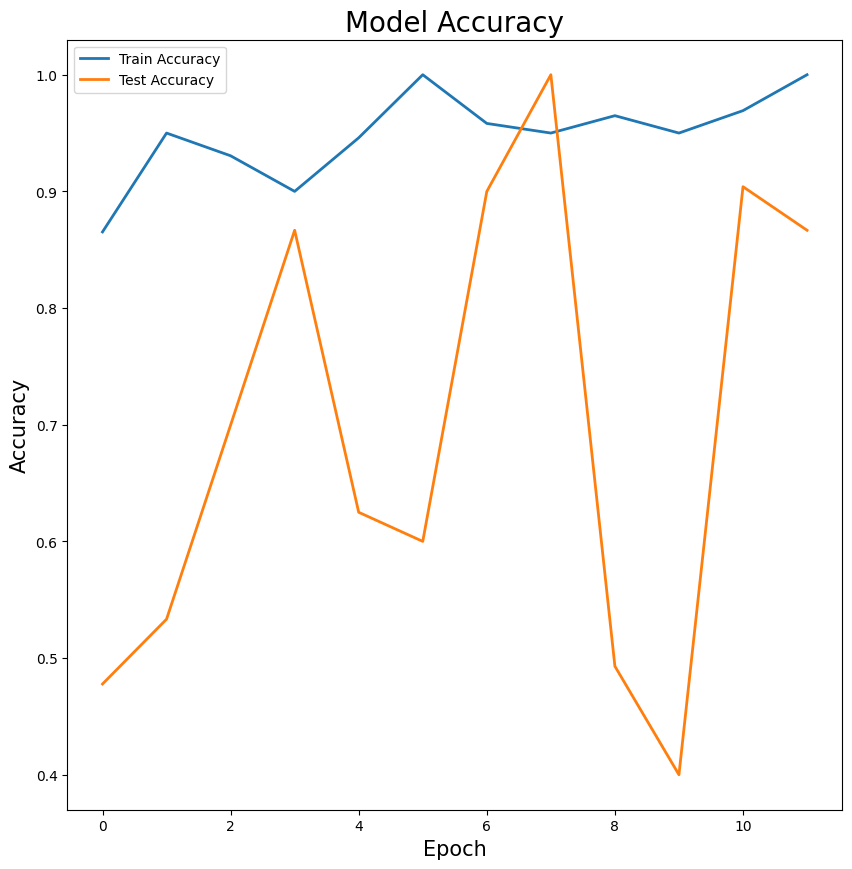

In [20]:
# summarize history for accuracy
plt.figure(figsize=(10,10))
plt.plot(history.history['accuracy'], lw=2)
plt.plot(history.history['val_accuracy'], lw=2)
plt.title('Model Accuracy', fontsize=20)
plt.ylabel('Accuracy', fontsize=15)
plt.xlabel('Epoch', fontsize=15)
plt.legend(['Train Accuracy', 'Test Accuracy'], loc='upper left')
plt.show()


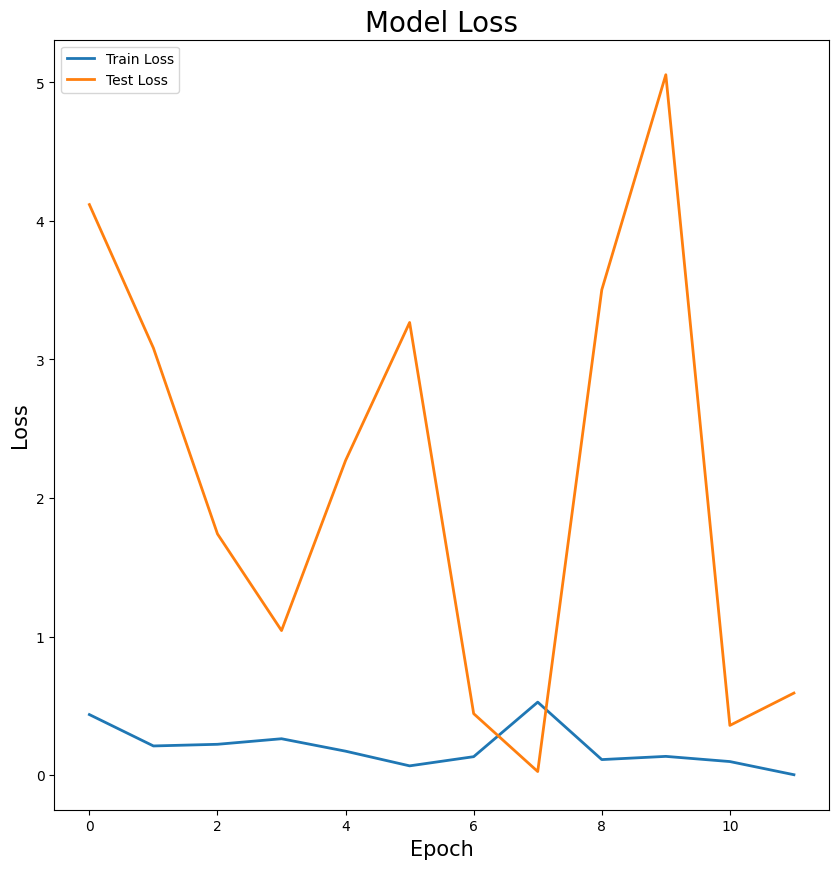

In [21]:
# summarize history for loss
plt.figure(figsize=(10,10))
plt.plot(history.history['loss'], lw=2)
plt.plot(history.history['val_loss'], lw=2)
plt.title('Model Loss', fontsize=20)
plt.ylabel('Loss', fontsize=15)
plt.xlabel('Epoch', fontsize=15)
plt.legend(['Train Loss', 'Test Loss'], loc='upper left')
plt.show()


In [22]:
pred=model.predict(test_data_generator,steps=valid_number//batch_size)
final_predict=np.argmax(pred,axis=1)
true_data=test_data_generator.classes

3514/3514 ━━━━━━━━━━━━━━━━━━━━ 375s 106ms/step 


In [23]:
print("Accuracy Score is",accuracy_score(true_data,final_predict))


Accuracy Score is 0.898361028909629


In [24]:
print("ROC AUC Score is {}".format(roc_auc_score(true_data, pred,multi_class='ovr')))

ROC AUC Score is 0.9989135899652496


In [25]:
# true_data: true labels
# pred: predicted labels

# convert true labels to binary format
num_classes = len(set(true_data))
true_data_bin = label_binarize(true_data, classes=range(num_classes))

# calculate average precision score for each class
avg_precisions = []
for class_idx in range(num_classes):
    y_true = true_data_bin[:, class_idx]
    y_pred = pred[:, class_idx]
    precision, recall, _ = precision_recall_curve(y_true, y_pred)
    avg_precisions.append(average_precision_score(y_true, y_pred))
    
# calculate the final score as the average of all class scores
macro_avg_precision = sum(avg_precisions) / num_classes

macro_avg_precision 

0.9796947088248691

In [26]:
# true_data: true labels
# pred: predicted labels

# convert true labels to binary format
num_classes = len(set(true_data))
true_data_bin = label_binarize(true_data, classes=range(num_classes))

# calculate average precision score for each class
avg_precisions = []
for class_idx in range(num_classes):
    y_true = true_data_bin[:, class_idx]
    y_pred = pred[:, class_idx]
    precision, recall, _ = precision_recall_curve(y_true, y_pred)
    avg_precisions.append(average_precision_score(y_true, y_pred))
    
# calculate the final score as the average of all class scores
macro_avg_precision = sum(avg_precisions) / num_classes

macro_avg_precision 

0.9796947088248691

879/879 ━━━━━━━━━━━━━━━━━━━━ 268s 305ms/step


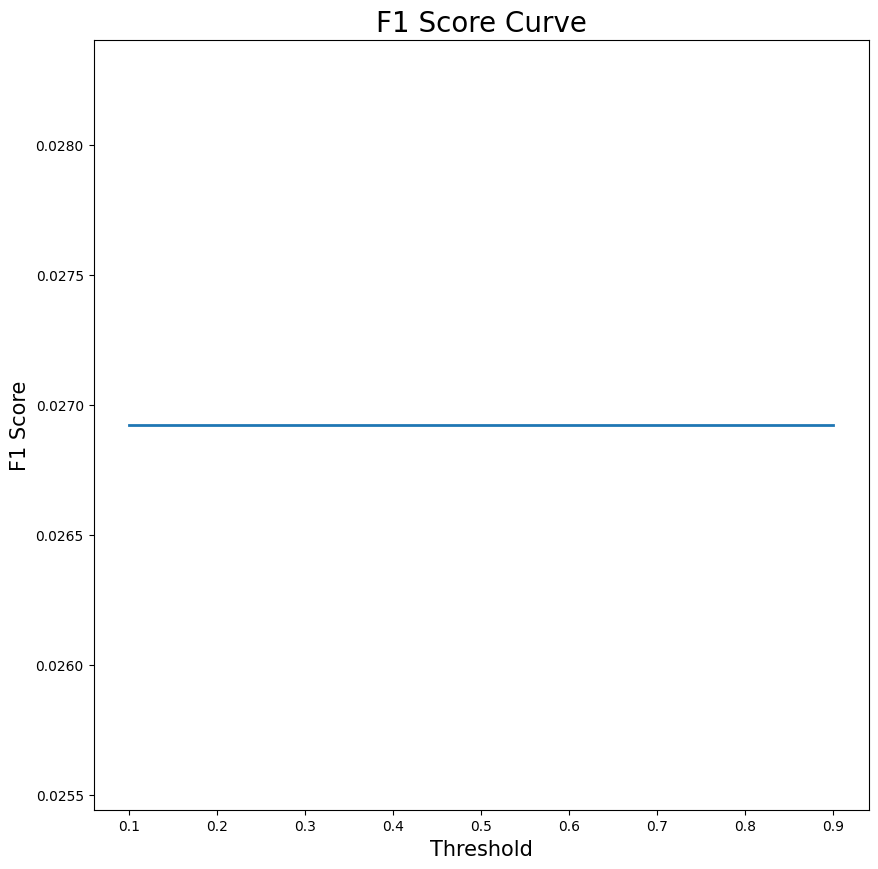

In [27]:
# Compute the F1 score for each threshold value
y_pred = model.predict(test_data_generator)
y_pred = np.argmax(y_pred, axis=1)
y_true = test_data_generator.classes

# Initialize list to store F1 scores
f1_scores = []
thresholds = np.arange(0.1, 1.0, 0.1)

# Calculate F1 score for each threshold
for threshold in thresholds:
    y_pred_threshold = (y_pred >= threshold).astype(int)
    f1_scores.append(f1_score(y_true, y_pred_threshold, average='macro'))

# Plot the F1 score curve
plt.figure(figsize=(10,10))
plt.plot(thresholds, f1_scores, lw=2)  
plt.xlabel('Threshold', fontsize=15)
plt.ylabel('F1 Score', fontsize=15)
plt.title('F1 Score Curve', fontsize=20)
plt.show()


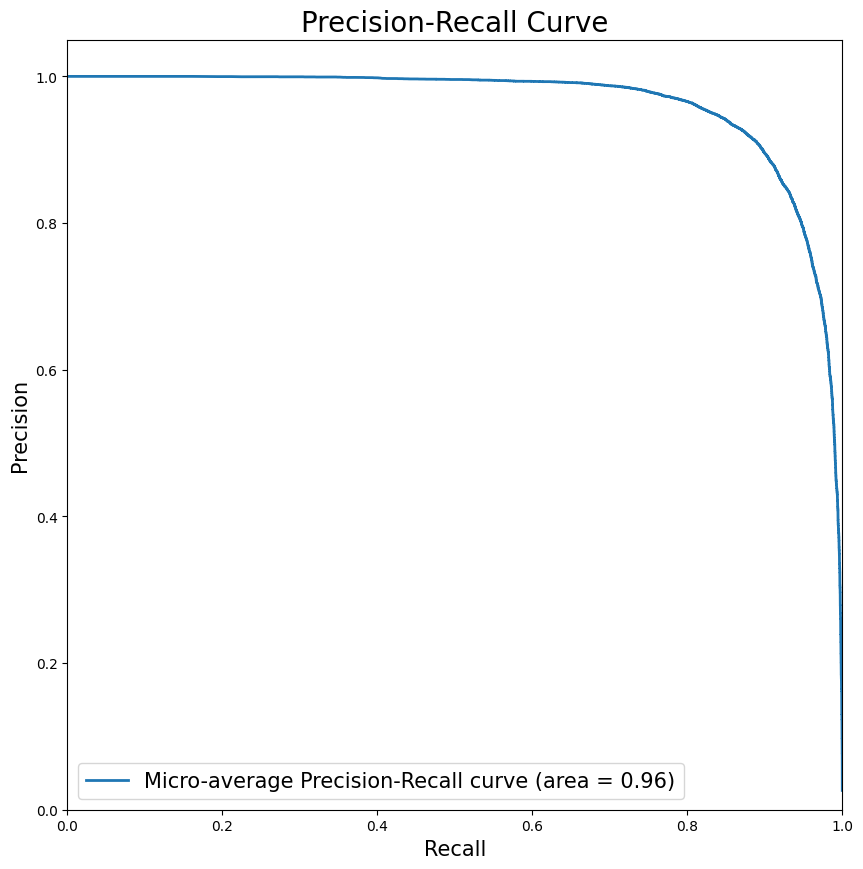

In [28]:
# Compute Precision-Recall and plot curve
binarize_label = label_binarize(true_data, classes=range(num_classes))
my_class = binarize_label.shape[1]
precision = dict()
recall = dict()
average_precision = dict()

for i in range(my_class):
    precision[i], recall[i], _ = precision_recall_curve(binarize_label[:, i], pred[:, i])
    average_precision[i] = average_precision_score(binarize_label[:, i], pred[:, i])

precision["micro"], recall["micro"], _ = precision_recall_curve(binarize_label.ravel(), pred.ravel())
average_precision["micro"] = average_precision_score(binarize_label, pred, average="micro")

# Plot Precision-Recall curve using default style
plt.figure(figsize=(10,10))
plt.plot(recall["micro"], precision["micro"], label='Micro-average Precision-Recall curve (area = {0:0.2f})'.format(average_precision["micro"]), linewidth=2)
plt.xlabel('Recall', fontsize=15)
plt.ylabel('Precision', fontsize=15)
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall Curve', fontsize=20)
plt.legend(loc="lower left", fontsize=15)
plt.show()


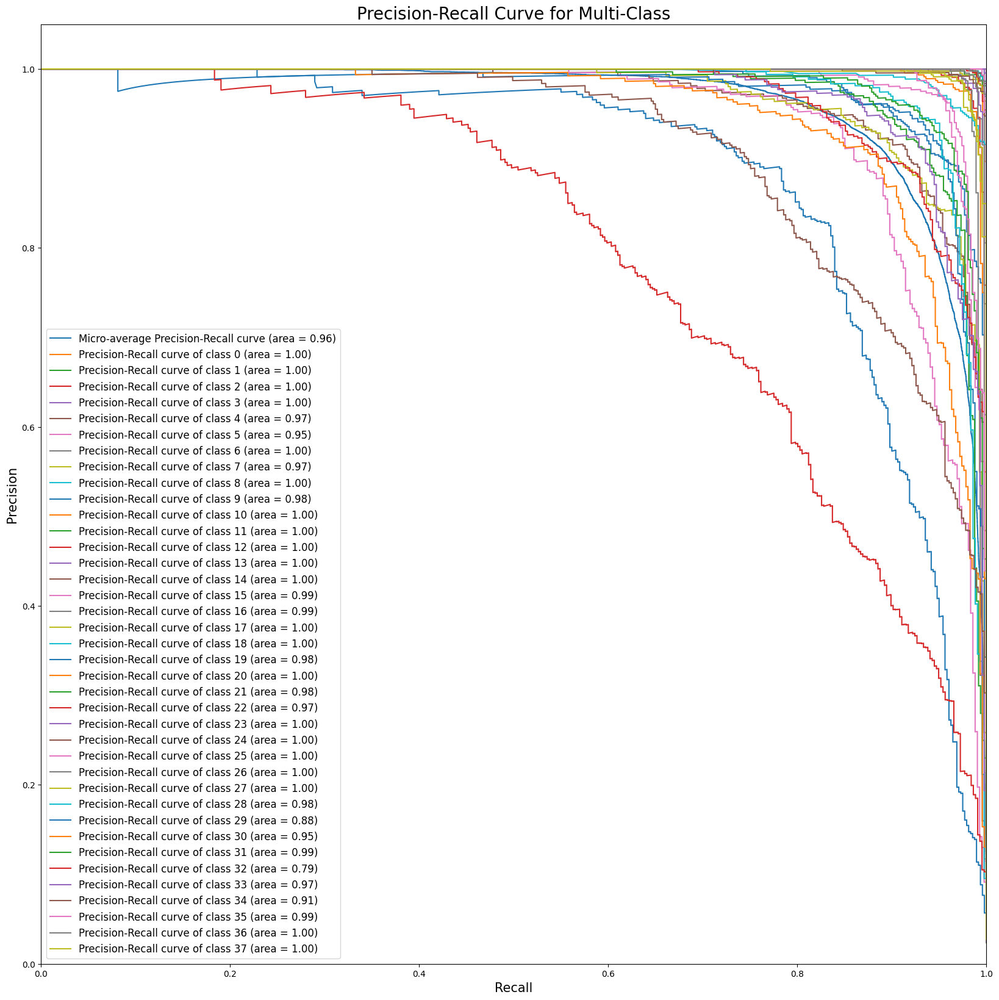

In [29]:
# Plot Precision-Recall curve for multi-class
plt.figure(figsize=(20, 20))

# Micro-average Precision-Recall curve
plt.plot(recall["micro"], precision["micro"],
         label='Micro-average Precision-Recall curve (area = {0:0.2f})'.format(average_precision["micro"]))

# Precision-Recall curve for each class
for i in range(my_class):
    plt.plot(recall[i], precision[i],
             label='Precision-Recall curve of class {0} (area = {1:0.2f})'.format(i, average_precision[i]))

# Set limits and labels
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall', fontsize=15)
plt.ylabel('Precision', fontsize=15)
plt.title('Precision-Recall Curve for Multi-Class', fontsize=20)

# Show legend
plt.legend(loc="best", fontsize=12)
plt.show()


879/879 ━━━━━━━━━━━━━━━━━━━━ 249s 283ms/step


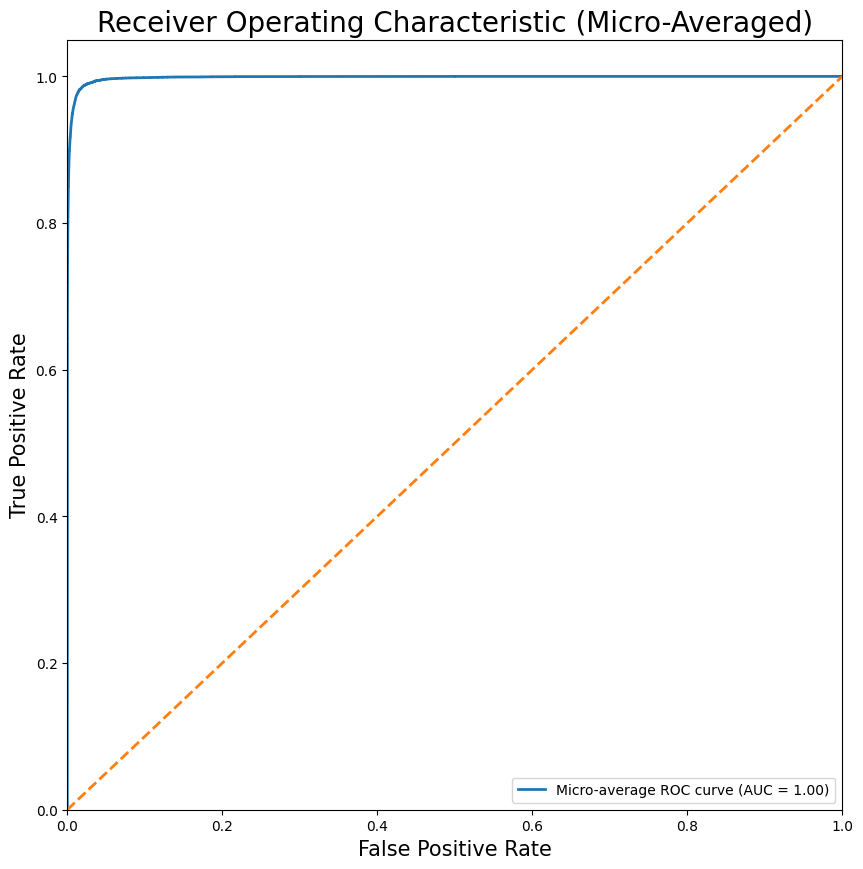

In [31]:
# Evaluate the model on the test data
test_steps = valid_number // batch_size
y_pred = model.predict(test_data_generator, test_steps)

# Compute the one-hot encoded class labels
y_true_onehot = tf.keras.utils.to_categorical(y_true)

# Compute the micro-averaged ROC curve and AUC score
fpr_micro, tpr_micro, thresholds_micro = roc_curve(y_true_onehot.ravel(), y_pred.ravel())
roc_auc_micro = auc(fpr_micro, tpr_micro)

# Plot the micro-averaged ROC curve
plt.figure(figsize=(10,10))
plt.plot(fpr_micro, tpr_micro, lw=2, label='Micro-average ROC curve (AUC = %0.2f)' % roc_auc_micro)
plt.plot([0, 1], [0, 1], lw=2, linestyle='--')  # Diagonal line for random performance
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=15)
plt.ylabel('True Positive Rate', fontsize=15)
plt.title('Receiver Operating Characteristic (Micro-Averaged)', fontsize=20)
plt.legend(loc="lower right")
plt.show()


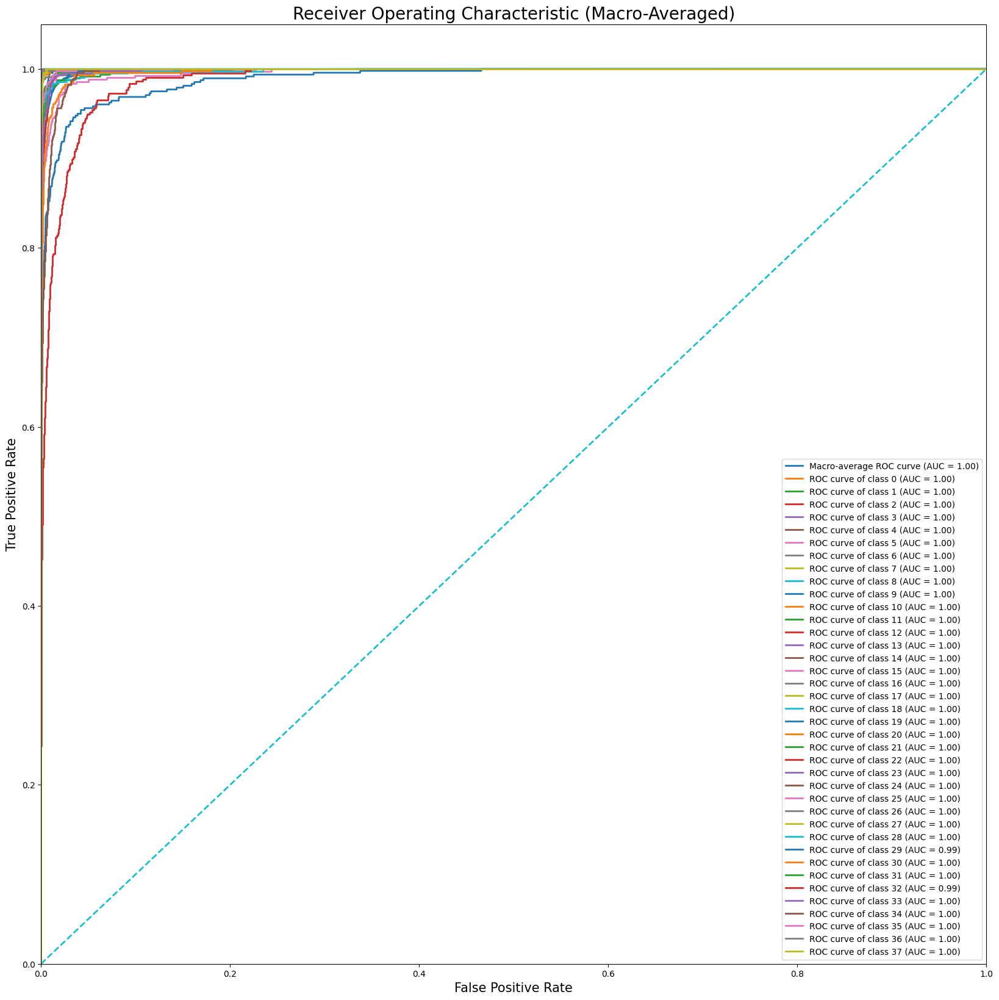

In [32]:
# Compute the macro-averaged ROC curve and AUC score
num_classes = 38

fpr_macro = dict()
tpr_macro = dict()
roc_auc_macro = dict()
for i in range(num_classes):
    fpr_macro[i], tpr_macro[i], _ = roc_curve(y_true_onehot[:, i], y_pred[:, i])
    roc_auc_macro[i] = auc(fpr_macro[i], tpr_macro[i])

# Compute the macro-average of the ROC curve and AUC score
fpr_macro["avg"], tpr_macro["avg"], _ = roc_curve(y_true_onehot.ravel(), y_pred.ravel())
roc_auc_macro["avg"] = auc(fpr_macro["avg"], tpr_macro["avg"])

# Plot the macro-averaged ROC curve
plt.figure(figsize=(20, 20))
plt.plot(fpr_macro["avg"], tpr_macro["avg"], lw=2, label='Macro-average ROC curve (AUC = %0.2f)' % roc_auc_macro["avg"])

# Plot ROC curve for each class
for i in range(num_classes):
    plt.plot(fpr_macro[i], tpr_macro[i], lw=2, label='ROC curve of class %d (AUC = %0.2f)' % (i, roc_auc_macro[i]))

# Plot diagonal line for random performance
plt.plot([0, 1], [0, 1], linestyle='--', lw=2)

# Set limits and labels
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=15)
plt.ylabel('True Positive Rate', fontsize=15)
plt.title('Receiver Operating Characteristic (Macro-Averaged)', fontsize=20)

# Show legend
plt.legend(loc="best")
plt.show()


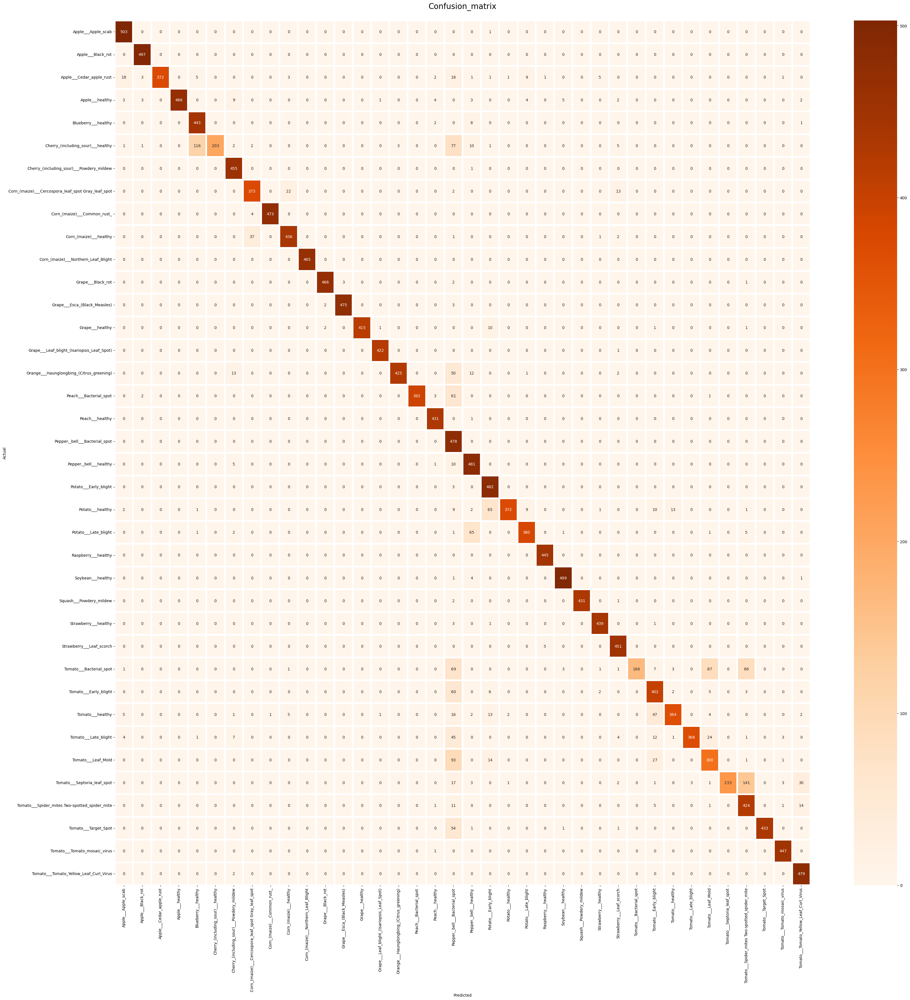

In [34]:
plt.figure(figsize=(40,40))
cm= confusion_matrix(test_data_generator.classes,final_predict)
sns.heatmap(cm,  annot=True ,fmt="d",cmap="Oranges",xticklabels=class_names,
            yticklabels=class_names,linewidth=4)
plt.title("Confusion_matrix\n",fontsize=20,color="black")
plt.ylabel('Actual')
plt.xlabel('Predicted')

plt.show()

In [35]:
print(classification_report(test_data_generator.classes, final_predict,target_names=class_list))


                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.94      1.00      0.97       504
                                 Apple___Black_rot       0.98      1.00      0.99       497
                          Apple___Cedar_apple_rust       1.00      0.85      0.92       440
                                   Apple___healthy       1.00      0.93      0.96       502
                               Blueberry___healthy       0.78      0.98      0.87       454
          Cherry_(including_sour)___Powdery_mildew       1.00      0.48      0.65       421
                 Cherry_(including_sour)___healthy       0.92      1.00      0.96       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.90      0.91      0.90       410
                       Corn_(maize)___Common_rust_       1.00      0.99      0.99       477
               Corn_(maize)___Northern_Leaf_Blight       0.93      0.91      0.

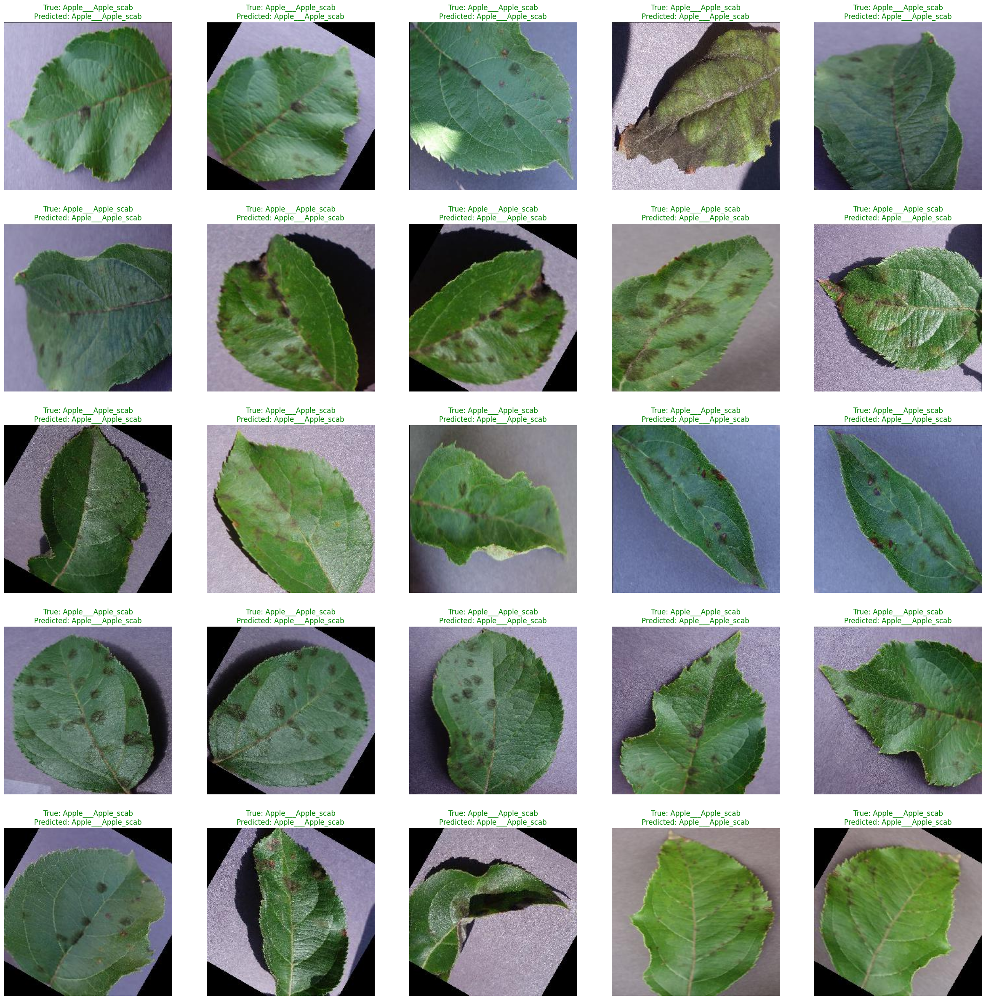

In [36]:
class_name = list(test_data_generator.class_indices.keys())

plt.figure(figsize=(30,30))
number_images=(5,5)
for i in range(1,(number_images[0]*number_images[1])+1):
    plt.subplot(number_images[0],number_images[1],i)
    plt.axis("off")
    
    true_label = class_name[test_data_generator.classes[i]]
    predicted_label = class_name[final_predict[i]]
    
    color="green"
    if true_label != predicted_label:
        color="red"
    
    plt.title(f"True: {true_label}\nPredicted: {predicted_label}", color=color)
    plt.imshow(plt.imread(test_data_generator.filepaths[i]))
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Predicted class: Tomato___Leaf_Mold
Probability: 0.8403596878051758


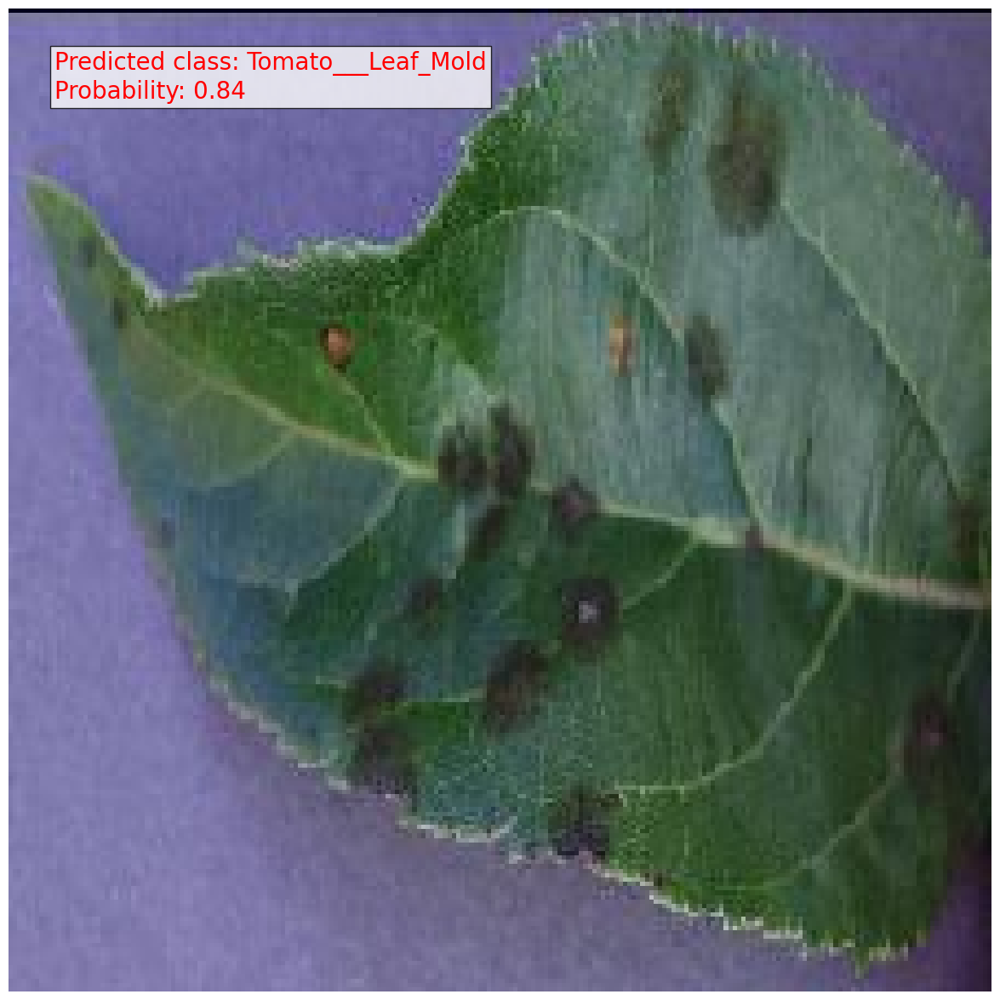

In [41]:
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

# Set the figure size for the plot
plt.figure(figsize=(15, 15))

# Load the trained model
# Replace with your actual model path
# model = load_model('/kaggle/working/my_model.h5')

# Load and preprocess the image
# Replace with your actual image path
img_path = 'Dataset/train/Apple___Apple_scab/01a66316-0e98-4d3b-a56f-d78752cd043f___FREC_Scab 3003_90deg.JPG'
img = image.load_img(img_path, target_size=(224, 224))  # Ensure the target size matches your model's input size
img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)  # Add batch dimension

# Predict the class probabilities
probs = model.predict(img)[0]

# Get the predicted class index and name
pred_class_prob = np.argmax(probs)
pred_class_name = class_names[pred_class_prob]  # Ensure class_names is defined or loaded correctly

# Print the predicted class name and probability
print(f'Predicted class: {pred_class_name}')
print(f'Probability: {probs[pred_class_prob]}')

# Display the image with the predicted class and probability
plt.imshow(img[0] / 255.0)  # Divide by 255 to convert image back to standard scale
plt.axis('off')
plt.text(10, 20, f'Predicted class: {pred_class_name}\nProbability: {probs[pred_class_prob]:.2f}', 
         fontsize=20, color='red', bbox=dict(facecolor='white', alpha=0.8))
plt.show()
